<a href="https://colab.research.google.com/github/alvitohawari/Hands-on-Machine-Learning-with-Scikit-Learn-Keras-TensorFlow/blob/main/Chapter_17_autoencoders_and_gans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Chapter 17 – Autoencoders and GANs**

_This notebook contains all the sample code in chapter 17._

## How this notebook maps to the PDF (Chapter 17)

This notebook is the **code implementation** of the concepts explained in the PDF **“Chapter 17 — Representation Learning and Generative Learning Using Autoencoders and GANs.”**  
To make it easier to study, I added short **“PDF mapping” notes** throughout the notebook.

### How to read the page references
- **PDF page N** refers to the page index of the uploaded PDF file (the one that shows *“page N / 41”* in this environment).
- The PDF also contains the book’s original page numbers (≈ **567–607**), which you may see in the footer.

Each major code section below now includes:
1) **What the PDF explains (concept/definition)**  
2) **How the code implements it (line-by-line guidance)**  
3) A pointer to the **relevant PDF section title + page range**


In [ ]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Is this notebook running on Colab or Kaggle?
IS_COLAB = "google.colab" in sys.modules
IS_KAGGLE = "kaggle_secrets" in sys.modules

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. LSTMs and CNNs can be very slow without a GPU.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")
    if IS_KAGGLE:
        print("Go to Settings > Accelerator and select GPU.")

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "autoencoders"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

No GPU was detected. LSTMs and CNNs can be very slow without a GPU.
Go to Runtime > Change runtime and select a GPU hardware accelerator.


A couple utility functions to plot grayscale 28x28 image:

In [ ]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

# PCA with a linear Autoencoder

## PDF mapping: Undercomplete linear autoencoder ≈ PCA

**PDF section:** *Efficient Data Representations* → *Performing PCA with an Undercomplete Linear Autoencoder* (PDF pp. 3–5).  
**Key idea from the PDF:** an autoencoder has an **encoder** that produces a latent representation (“coding”) and a **decoder** that reconstructs the input. If we force the coding to be lower-dimensional (**undercomplete**) and train the network to reconstruct its input, the model must learn a compact representation rather than memorizing. When the autoencoder uses **only linear layers** and is trained with **MSE**, it ends up learning the same subspace as **PCA**.

### How the code implements the PDF
- **Generate a 3D dataset** (the next code cell).  
- Build:
  - an **encoder**: `Dense(2, input_shape=[3])` → compresses 3D → 2D (the *coding layer*),
  - a **decoder**: `Dense(3, input_shape=[2])` → reconstructs back to 3D,
  - an **autoencoder**: `Sequential([encoder, decoder])`.
- Compile with `loss="mse"` and a simple optimizer (`SGD(lr=0.1)`), matching the “linear + MSE” condition described in the PDF.
- Train using the **same data as inputs and targets**: `fit(X_train, X_train, ...)` (self-supervised reconstruction).
- Finally, `encoder.predict(X_train)` returns the **2D PCA-like projection** (the learned codings).


Build 3D dataset:

In [ ]:
np.random.seed(4)

def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(60)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

Now let's build the Autoencoder...

In [ ]:
np.random.seed(42)
tf.random.set_seed(42)

encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
autoencoder = keras.models.Sequential([encoder, decoder])

autoencoder.compile(loss="mse", optimizer=keras.optimizers.SGD(learning_rate=1.5))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history = autoencoder.fit(X_train, X_train, epochs=20)

Epoch 1/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 1.1589 
Epoch 2/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.2085
Epoch 3/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0478
Epoch 4/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0455
Epoch 5/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0626
Epoch 6/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0640
Epoch 7/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0367
Epoch 8/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0181
Epoch 9/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0124
Epoch 10/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0110
Epoch 11/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0108
Epoch 12/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0109
Epoch 13/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0108
Epoch 14/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0105
Epoch 15/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0100
Epoch 16/20
2/2 ━━━━━━━━━━━━━━━━━

In [ ]:
codings = encoder.predict(X_train)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Saving figure linear_autoencoder_pca_plot


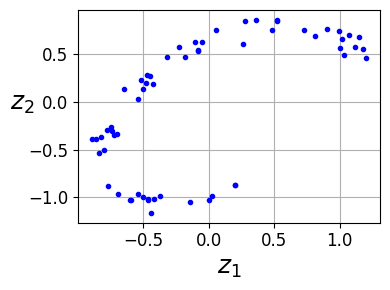

In [ ]:
fig = plt.figure(figsize=(4,3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
save_fig("linear_autoencoder_pca_plot")
plt.show()

# Stacked Autoencoders

## PDF mapping: Stacked (deep) autoencoders

**PDF section:** *Stacked Autoencoders* (PDF pp. 6–10).  
**Key idea from the PDF:** adding more layers lets the autoencoder learn **more complex codings**, but if it becomes too powerful it can “cheat” by memorizing instead of learning useful features. The architecture is often **symmetric** (a “sandwich”): encoder layers compress toward a central coding layer, then decoder layers expand back.

### How the code implements the PDF
- Load and normalize **Fashion MNIST** (next code cell).
- The encoder:
  - flattens images (28×28 → 784),
  - compresses through Dense layers (e.g., 100 → 30 units) using **SELU**.
- The decoder:
  - expands back (30 → 100 → 784),
  - uses **sigmoid** at the output because pixel values are treated like probabilities.
- The model is trained to reconstruct images: `fit(X_train, X_train, ...)`.

**Why `binary_crossentropy`?**  
As the PDF explains, if you interpret each pixel as a probability, reconstruction becomes a multilabel binary classification task, and binary cross-entropy often converges faster than MSE.


Let's use MNIST:

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

## Train all layers at once

### PDF mapping: Training the full stacked autoencoder end-to-end

**PDF section:** *Implementing a Stacked Autoencoder Using Keras* + *Visualizing the Reconstructions* (PDF pp. 6–8).  
**What the PDF emphasizes:** a practical sanity-check is to **compare input images vs reconstructions**. If reconstructions are too blurry/lossy, you may need longer training, deeper networks, or a larger coding layer—but making the model too powerful can reduce representation quality.

### How the code implements it
- Builds encoder/decoder as two `Sequential` submodels and composes them into `stacked_ae`.
- Trains end-to-end with `fit(...)`.
- Uses helper functions to display **originals (top) vs reconstructions (bottom)**, matching the PDF’s recommended diagnostic.


Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [ ]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

stacked_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])
stacked_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(learning_rate=1.5), metrics=[rounded_accuracy])
history = stacked_ae.fit(X_train, X_train, epochs=20,
                         validation_data=(X_valid, X_valid))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3806 - rounded_accuracy: 0.8490 - val_loss: 0.3142 - val_rounded_accuracy: 0.9058
Epoch 2/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3076 - rounded_accuracy: 0.9129 - val_loss: 0.3041 - val_rounded_accuracy: 0.9152
Epoch 3/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2999 - rounded_accuracy: 0.9197 - val_loss: 0.2989 - val_rounded_accuracy: 0.9203
Epoch 4/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.2953 - rounded_accuracy: 0.9237 - val_loss: 0.2959 - val_rounded_accuracy: 0.9233
Epoch 5/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2926 - rounded_accuracy: 0.9261 - val_loss: 0.2935 - val_rounded_accuracy: 0.9259
Epoch 6/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2905 - rounded_accuracy: 0.9279 - val_loss: 0.2922 - val_rounded_accuracy: 0.9263
Epoch 7/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2891 - rounded_accuracy: 0.9291 - val_loss: 0.2904 - val_rou

This function processes a few test images through the autoencoder and displays the original images and their reconstructions:

In [ ]:
def show_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = model.predict(images[:n_images])
    # If the model has a single output, predict() might return a list containing one array.
    # We extract the array from the list if that's the case.
    if isinstance(reconstructions, list) and len(reconstructions) == 1:
        reconstructions = reconstructions[0]

    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Saving figure reconstruction_plot


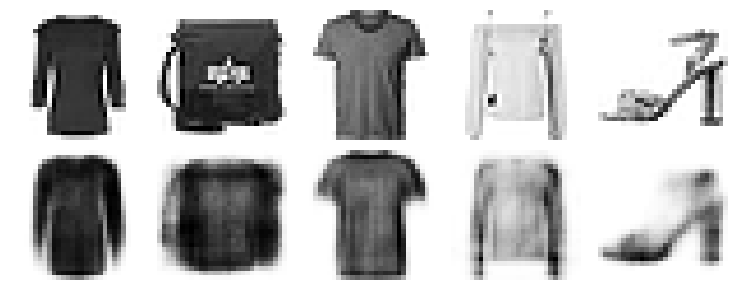

In [ ]:
show_reconstructions(stacked_ae)
save_fig("reconstruction_plot")

# Visualizing Fashion MNIST

## PDF mapping: Using an autoencoder for visualization (AE → t-SNE)

**PDF section:** *Visualizing the Fashion MNIST Dataset* (PDF pp. 8–9).  
**Key idea from the PDF:** autoencoders can reduce dimensionality efficiently on large datasets. A common strategy is:
1) use the encoder to compress high-dimensional inputs into a moderate latent space (e.g., 30D), then  
2) apply another method (e.g., **t-SNE**) to reach 2D for visualization.

### How the code implements it
- `stacked_encoder.predict(X_valid)` produces 30D compressed vectors.
- `TSNE().fit_transform(...)` maps these vectors into 2D.
- The scatter plot colors points by class label to reveal clusters.


In [ ]:
np.random.seed(42)

from sklearn.manifold import TSNE

X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE()
X_valid_2D = tsne.fit_transform(X_valid_compressed)
X_valid_2D = (X_valid_2D - X_valid_2D.min()) / (X_valid_2D.max() - X_valid_2D.min())

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


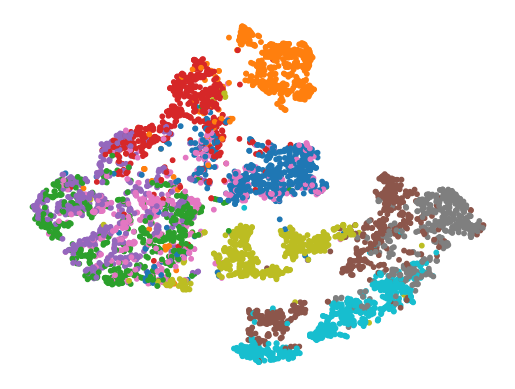

In [ ]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
plt.axis("off")
plt.show()

Let's make this diagram a bit prettier:

Saving figure fashion_mnist_visualization_plot


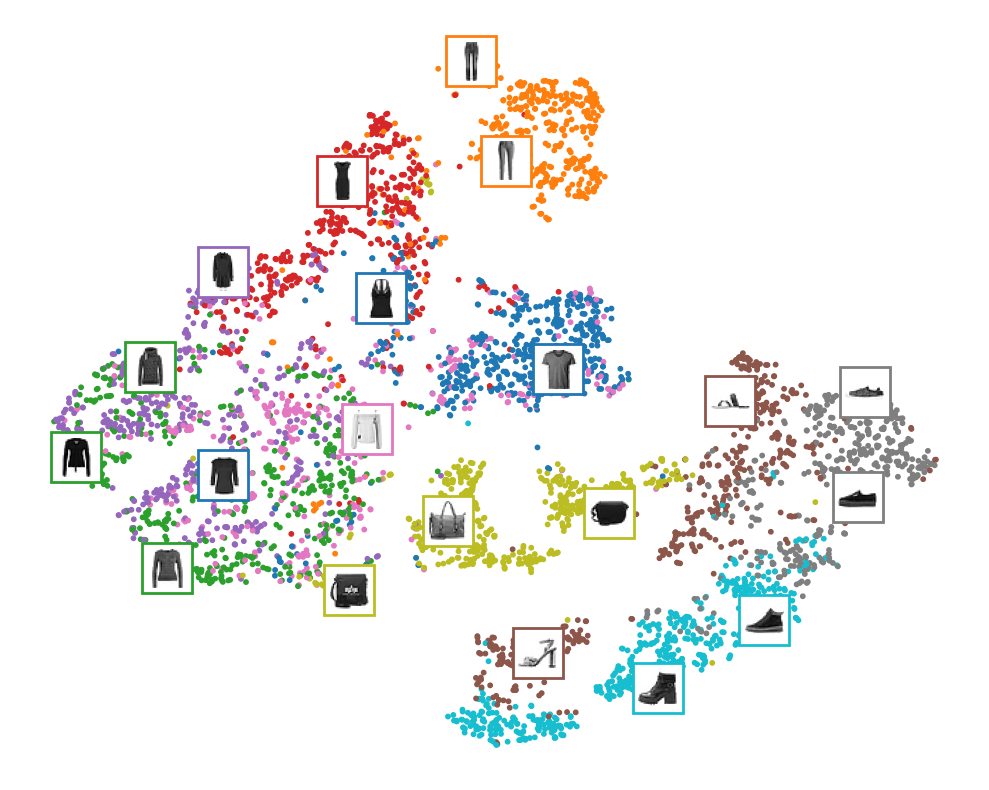

In [ ]:
# adapted from https://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_valid_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
save_fig("fashion_mnist_visualization_plot")
plt.show()

## Tying weights

### PDF mapping: Tying encoder/decoder weights

**PDF section:** *Tying Weights* (PDF pp. 11–12).  
**Key idea from the PDF:** when the autoencoder is symmetric, you can **tie decoder weights to the transpose of encoder weights**. This reduces parameters (often ~half), speeds up training, and can reduce overfitting.

### How the code implements it
- Defines a custom `DenseTranspose` layer that reuses another Dense layer’s kernel matrix but transposed.
- Builds the decoder using `DenseTranspose(dense_2)` and `DenseTranspose(dense_1)` so decoder weights are tied to encoder weights.


It is common to tie the weights of the encoder and the decoder, by simply using the transpose of the encoder's weights as the decoder weights. For this, we need to use a custom layer.

In [ ]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        self.dense = dense
        self.activation = keras.activations.get(activation)
        super().__init__(**kwargs)
    def build(self, batch_input_shape):
        # The bias shape should match the input dimension of the wrapped dense layer,
        # which is the first dimension of its kernel weights.
        # This assumes the wrapped dense layer has already been built (and thus its weights created).
        # self.dense.weights[0] refers to the kernel weights, its shape is (input_dim, output_dim).
        # We need the input_dim for the bias shape in the transposed layer.
        self.biases = self.add_weight(name="bias",
                                      shape=[self.dense.weights[0].shape[0]], # Use kernel shape's first dimension
                                      initializer="zeros")
        super().build(batch_input_shape)
    def call(self, inputs):
        z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(z + self.biases)

In [ ]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

dense_1 = keras.layers.Dense(100, activation="selu")
dense_2 = keras.layers.Dense(30, activation="selu")

# Manually build dense_1 and dense_2 to ensure their input_shape attributes are set
dense_1.build(input_shape=(None, 28 * 28)) # Flattened image size is 28*28
dense_2.build(input_shape=(None, 100))   # Output of dense_1 is 100

tied_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    dense_1,
    dense_2
])

tied_decoder = keras.models.Sequential([
    DenseTranspose(dense_2, activation="selu"),
    DenseTranspose(dense_1, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])

tied_ae.compile(loss="binary_crossentropy",
                optimizer=keras.optimizers.SGD(learning_rate=1.5), metrics=[rounded_accuracy])
history = tied_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3705 - rounded_accuracy: 0.8585 - val_loss: 0.3074 - val_rounded_accuracy: 0.9100
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3003 - rounded_accuracy: 0.9195 - val_loss: 0.2962 - val_rounded_accuracy: 0.9231
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.2932 - rounded_accuracy: 0.9261 - val_loss: 0.2919 - val_rounded_accuracy: 0.9289
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2897 - rounded_accuracy: 0.9293 - val_loss: 0.2894 - val_rounded_accuracy: 0.9306
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2875 - rounded_accuracy: 0.9313 - val_loss: 0.2879 - val_rounded_accuracy: 0.9325
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2860 - rounded_accuracy: 0.9327 - val_loss: 0.2867 - val_rounded_accuracy: 0.9336
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2849 - rounded_accuracy: 0.9338 - val_loss: 0.2857 - val_rou

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


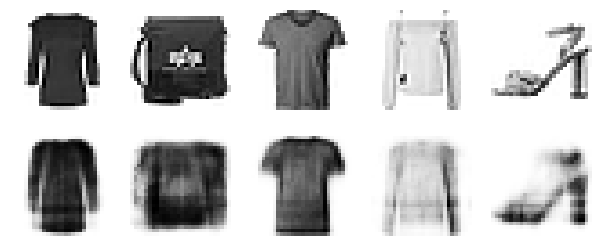

In [ ]:
show_reconstructions(tied_ae)
plt.show()

## Training one Autoencoder at a Time

### PDF mapping: Greedy layer-wise training (one autoencoder at a time)

**PDF section:** *Training One Autoencoder at a Time* (PDF pp. 12–13).  
**Key idea from the PDF:** instead of training a deep “sandwich” end-to-end, you can train:
1) a shallow autoencoder on the raw inputs,  
2) encode the dataset using its encoder,  
3) train a new shallow autoencoder on the encoded dataset,  
and so on—then stack the trained pieces. This is also called **greedy layer-wise training**.

### How the code implements it
- Trains the first autoencoder, then uses its encoder to transform the dataset.
- Trains the next autoencoder on the transformed data.
- Finally, stacks the encoders and decoders to form a deeper autoencoder.


In [ ]:
def train_autoencoder(n_neurons, X_train, X_valid, loss, optimizer,
                      n_epochs=10, output_activation=None, metrics=None):
    n_inputs = X_train.shape[-1]
    encoder = keras.models.Sequential([
        keras.layers.Dense(n_neurons, activation="selu", input_shape=[n_inputs])
    ])
    decoder = keras.models.Sequential([
        keras.layers.Dense(n_inputs, activation=output_activation),
    ])
    autoencoder = keras.models.Sequential([encoder, decoder])
    autoencoder.compile(optimizer, loss, metrics=metrics)
    autoencoder.fit(X_train, X_train, epochs=n_epochs,
                    validation_data=(X_valid, X_valid))
    return encoder, decoder, encoder(X_train), encoder(X_valid)

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

K = keras.backend
X_train_flat = K.batch_flatten(X_train) # equivalent to .reshape(-1, 28 * 28)
X_valid_flat = K.batch_flatten(X_valid)
enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
    100, X_train_flat, X_valid_flat, "binary_crossentropy",
    keras.optimizers.SGD(learning_rate=1.5), output_activation="sigmoid",
    metrics=[rounded_accuracy])
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_valid_enc1, "mse", keras.optimizers.SGD(learning_rate=0.05),
    output_activation="selu")

Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3961 - rounded_accuracy: 0.8448 - val_loss: 0.3120 - val_rounded_accuracy: 0.9153
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.3062 - rounded_accuracy: 0.9181 - val_loss: 0.3002 - val_rounded_accuracy: 0.9251
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.2961 - rounded_accuracy: 0.9272 - val_loss: 0.2931 - val_rounded_accuracy: 0.9318
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 0.2898 - rounded_accuracy: 0.9332 - val_loss: 0.2887 - val_rounded_accuracy: 0.9361
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.2858 - rounded_accuracy: 0.9371 - val_loss: 0.2857 - val_rounded_accuracy: 0.9392
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2830 - rounded_accuracy: 0.9398 - val_loss: 0.2834 - val_rounded_accuracy: 0.9413
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.2809 - rounded_accuracy: 0.9418 - val_loss: 0.2817 - val_rounded_accura

In [ ]:
stacked_ae_1_by_1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    enc1, enc2, dec2, dec1,
    keras.layers.Reshape([28, 28])
])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


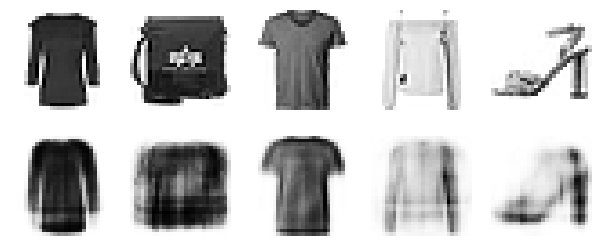

In [ ]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

In [ ]:
stacked_ae_1_by_1.compile(loss="binary_crossentropy",
                          optimizer=keras.optimizers.SGD(learning_rate=0.1), metrics=[rounded_accuracy])
history = stacked_ae_1_by_1.fit(X_train, X_train, epochs=10,
                                validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2862 - rounded_accuracy: 0.9346 - val_loss: 0.2878 - val_rounded_accuracy: 0.9349
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2857 - rounded_accuracy: 0.9351 - val_loss: 0.2876 - val_rounded_accuracy: 0.9352
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.2855 - rounded_accuracy: 0.9354 - val_loss: 0.2874 - val_rounded_accuracy: 0.9354
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2853 - rounded_accuracy: 0.9356 - val_loss: 0.2873 - val_rounded_accuracy: 0.9356
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2852 - rounded_accuracy: 0.9357 - val_loss: 0.2871 - val_rounded_accuracy: 0.9357
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2851 - rounded_accuracy: 0.9359 - val_loss: 0.2870 - val_rounded_accuracy: 0.9358
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2850 - rounded_accuracy: 0.9360 - val_loss: 0.2869 - val_rou

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


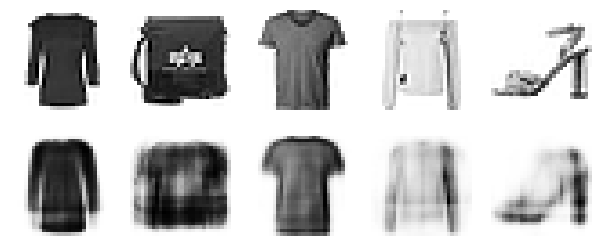

In [ ]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

## Using Convolutional Layers Instead of Dense Layers

### PDF mapping: Convolutional autoencoders

**PDF section:** *Convolutional Autoencoders* (PDF pp. 13–14).  
**Key idea from the PDF:** for images, dense autoencoders don’t scale well. A convolutional autoencoder uses:
- a **CNN encoder** (Conv + Pool) to reduce spatial dimensions while increasing feature depth, and
- a **decoder** that upsamples, commonly with **Conv2DTranspose** (or upsampling + Conv).

### How the code implements it
- The encoder reshapes inputs to `[28, 28, 1]`, then applies Conv2D + MaxPool blocks.
- The decoder uses `Conv2DTranspose` layers to upsample back to 28×28 and ends with sigmoid to output pixel probabilities.


Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

conv_encoder = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2)
])
conv_decoder = keras.models.Sequential([
    keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="VALID", activation="selu",
                                 input_shape=[3, 3, 64]),
    keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="SAME", activation="selu"),
    keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="SAME", activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
conv_ae = keras.models.Sequential([conv_encoder, conv_decoder])

conv_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                metrics=[rounded_accuracy])
history = conv_ae.fit(X_train, X_train, epochs=5,
                      validation_data=(X_valid, X_valid))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv_transpose.py:94: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.3340 - rounded_accuracy: 0.8925 - val_loss: 0.2813 - val_rounded_accuracy: 0.9394
Epoch 2/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2767 - rounded_accuracy: 0.9399 - val_loss: 0.2738 - val_rounded_accuracy: 0.9441
Epoch 3/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2711 - rounded_accuracy: 0.9457 - val_loss: 0.2699 - val_rounded_accuracy: 0.9488
Epoch 4/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 41s 20ms/step - loss: 0.2684 - rounded_accuracy: 0.9486 - val_loss: 0.2679 - val_rounded_accuracy: 0.9512
Epoch 5/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.2666 - rounded_accuracy: 0.9505 - val_loss: 0.2667 - val_rounded_accuracy: 0.9526


In [ ]:
conv_encoder.summary()
conv_decoder.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_2 (Reshape)             │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 28, 28, 16)     │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 14, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 7, 7, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 3, 3, 64)       │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,296 (91.00 KB)

 Trainable params: 23,296 (91.00 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_transpose                │ (None, 7, 7, 32)       │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 14, 14, 16)     │         4,624 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 28, 28, 1)      │           145 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_3 (Reshape)             │ (None, 28, 28)         │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,233 (90.75 KB)

 Trainable params: 23,233 (90.75 KB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


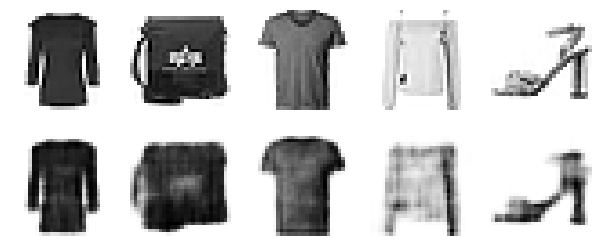

In [ ]:
show_reconstructions(conv_ae)
plt.show()

# Recurrent Autoencoders

## PDF mapping: Recurrent autoencoders (sequence-to-vector + vector-to-sequence)

**PDF section:** *Recurrent Autoencoders* (PDF p. 14).  
**Key idea from the PDF:** for sequences (time series, text, or even treating each image row as a time step), an RNN autoencoder typically:
- encodes a sequence into a single vector (sequence → vector),
- then decodes the vector back into a sequence (vector → sequence).
A `RepeatVector` is often used so the decoder receives the same latent vector at every time step.

### How the code implements it
- The encoder uses stacked LSTMs and outputs a single latent vector.
- The decoder uses `RepeatVector` followed by an LSTM with `return_sequences=True`, then a `TimeDistributed(Dense(...))` to produce per-step outputs.


In [ ]:
recurrent_encoder = keras.models.Sequential([
    keras.layers.LSTM(100, return_sequences=True, input_shape=[28, 28]),
    keras.layers.LSTM(30)
])
recurrent_decoder = keras.models.Sequential([
    keras.layers.RepeatVector(28, input_shape=[30]),
    keras.layers.LSTM(100, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(28, activation="sigmoid"))
])
recurrent_ae = keras.models.Sequential([recurrent_encoder, recurrent_decoder])
recurrent_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(0.1),
                     metrics=[rounded_accuracy])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/repeat_vector.py:29: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
history = recurrent_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 62s 34ms/step - loss: 0.5506 - rounded_accuracy: 0.7334 - val_loss: 0.4277 - val_rounded_accuracy: 0.8306
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 79s 32ms/step - loss: 0.4034 - rounded_accuracy: 0.8409 - val_loss: 0.3693 - val_rounded_accuracy: 0.8670
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 82s 32ms/step - loss: 0.3637 - rounded_accuracy: 0.8710 - val_loss: 0.3537 - val_rounded_accuracy: 0.8810
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.3502 - rounded_accuracy: 0.8821 - val_loss: 0.3443 - val_rounded_accuracy: 0.8872
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.3401 - rounded_accuracy: 0.8887 - val_loss: 0.3355 - val_rounded_accuracy: 0.8942
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 82s 32ms/step - loss: 0.3327 - rounded_accuracy: 0.8935 - val_loss: 0.3306 - val_rounded_accuracy: 0.8968
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.3277 - rounded_accuracy: 0.8967 - val_loss: 0.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


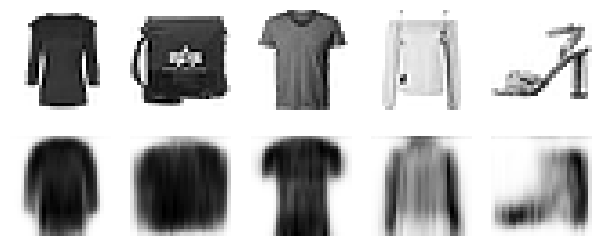

In [ ]:
show_reconstructions(recurrent_ae)
plt.show()

# Stacked denoising Autoencoder

## PDF mapping: Denoising autoencoders (learn to remove noise)

**PDF section:** *Denoising Autoencoders* (PDF pp. 15–16).  
**Key idea from the PDF:** add noise to inputs (e.g., Gaussian noise or dropout-like masking) and train the autoencoder to reconstruct the **clean** input. This prevents trivial copying and encourages the model to learn robust features; it can also be used directly for **noise removal**.

### How the code implements it
- Adds a `Dropout(...)` layer at the encoder input (active only during training).
- Trains on clean targets: inputs are noisy during training, but the target remains `X_train`.
- Visualizes reconstructions to confirm denoising behavior.


Using Gaussian noise:

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

denoising_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.GaussianNoise(0.2),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
denoising_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
denoising_ae = keras.models.Sequential([denoising_encoder, denoising_decoder])
denoising_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                     metrics=[rounded_accuracy])
history = denoising_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.3966 - rounded_accuracy: 0.8360 - val_loss: 0.3191 - val_rounded_accuracy: 0.9015
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.3141 - rounded_accuracy: 0.9074 - val_loss: 0.3099 - val_rounded_accuracy: 0.9098
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.3070 - rounded_accuracy: 0.9135 - val_loss: 0.3042 - val_rounded_accuracy: 0.9171
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3033 - rounded_accuracy: 0.9166 - val_loss: 0.3011 - val_rounded_accuracy: 0.9202
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.3005 - rounded_accuracy: 0.9190 - val_loss: 0.2994 - val_rounded_accuracy: 0.9243
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2982 - rounded_accuracy: 0.9212 - val_loss: 0.2963 - val_rounded_accuracy: 0.9245
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.2964 - rounded_accuracy: 0.9227 - val_loss: 0.2964 - val_rou

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


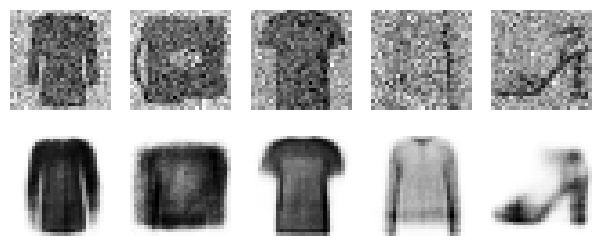

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

noise = keras.layers.GaussianNoise(0.2)
show_reconstructions(denoising_ae, noise(X_valid, training=True))
plt.show()

Using dropout:

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

dropout_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
dropout_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
dropout_ae = keras.models.Sequential([dropout_encoder, dropout_decoder])
dropout_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                   metrics=[rounded_accuracy])
history = dropout_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.4060 - rounded_accuracy: 0.8279 - val_loss: 0.3184 - val_rounded_accuracy: 0.9042
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3189 - rounded_accuracy: 0.9020 - val_loss: 0.3113 - val_rounded_accuracy: 0.9122
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3122 - rounded_accuracy: 0.9075 - val_loss: 0.3063 - val_rounded_accuracy: 0.9156
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.3083 - rounded_accuracy: 0.9107 - val_loss: 0.3031 - val_rounded_accuracy: 0.9177
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3056 - rounded_accuracy: 0.9128 - val_loss: 0.3017 - val_rounded_accuracy: 0.9204
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3037 - rounded_accuracy: 0.9143 - val_loss: 0.3004 - val_rounded_accuracy: 0.9216
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3022 - rounded_accuracy: 0.9157 - val_loss: 0.2977 - val_rou

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Saving figure dropout_denoising_plot


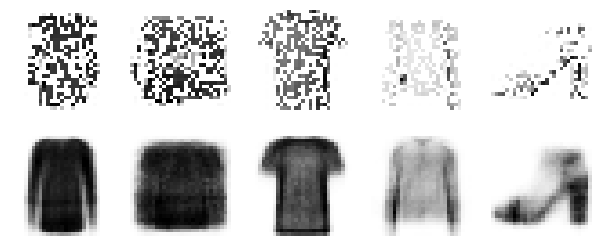

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

dropout = keras.layers.Dropout(0.5)
show_reconstructions(dropout_ae, dropout(X_valid, training=True))
save_fig("dropout_denoising_plot", tight_layout=False)

# Sparse Autoencoder

## PDF mapping: Sparse autoencoders (L1 and KL-divergence sparsity)

**PDF section:** *Sparse Autoencoders* (PDF pp. 16–19).  
**Key idea from the PDF:** instead of making the coding layer small, you can keep it larger but force **most activations to be near zero** (sparse). Two common approaches:
1) **L1 activity regularization**: penalize the absolute value of activations.  
2) **KL-divergence sparsity**: penalize the difference between a target activation probability *p* (e.g., 0.1) and the observed mean activation *q* across a batch.

### How the code implements it
- **L1 sparsity:** uses `ActivityRegularization(l1=...)` (or an `activity_regularizer`) after a sigmoid coding layer.
- **KL sparsity:** defines a custom `KLDivergenceRegularizer` that:
  - computes mean activations per neuron across the batch,
  - applies KL divergence penalties to push the mean toward the target sparsity,
  - scales the penalty by a weight hyperparameter.


Let's build a simple stacked autoencoder, so we can compare it to the sparse autoencoders we will build. This time we will use the sigmoid activation function for the coding layer, to ensure that the coding values range from 0 to 1:

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

simple_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="sigmoid"),
])
simple_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
simple_ae = keras.models.Sequential([simple_encoder, simple_decoder])
simple_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.),
                  metrics=[rounded_accuracy])
history = simple_ae.fit(X_train, X_train, epochs=10,
                        validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.4904 - rounded_accuracy: 0.7430 - val_loss: 0.3802 - val_rounded_accuracy: 0.8480
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.3702 - rounded_accuracy: 0.8562 - val_loss: 0.3582 - val_rounded_accuracy: 0.8672
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3486 - rounded_accuracy: 0.8789 - val_loss: 0.3412 - val_rounded_accuracy: 0.8849
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.3355 - rounded_accuracy: 0.8896 - val_loss: 0.3302 - val_rounded_accuracy: 0.8989
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.3247 - rounded_accuracy: 0.8983 - val_loss: 0.3234 - val_rounded_accuracy: 0.9014
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3193 - rounded_accuracy: 0.9024 - val_loss: 0.3224 - val_rounded_accuracy: 0.9043
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3165 - rounded_accuracy: 0.9046 - val_loss: 0.3216 - val_rou

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


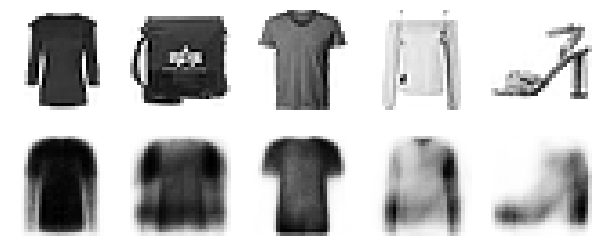

In [ ]:
show_reconstructions(simple_ae)
plt.show()

Let's create a couple functions to print nice activation histograms:

In [ ]:
def plot_percent_hist(ax, data, bins):
    counts, _ = np.histogram(data, bins=bins)
    widths = bins[1:] - bins[:-1]
    x = bins[:-1] + widths / 2
    ax.bar(x, counts / len(data), width=widths*0.8)
    ax.xaxis.set_ticks(bins)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(
        lambda y, position: "{}%".format(int(np.round(100 * y)))))
    ax.grid(True)

In [ ]:
def plot_activations_histogram(encoder, height=1, n_bins=10):
    X_valid_codings = encoder(X_valid).numpy()
    activation_means = X_valid_codings.mean(axis=0)
    mean = activation_means.mean()
    bins = np.linspace(0, 1, n_bins + 1)

    fig, [ax1, ax2] = plt.subplots(figsize=(10, 3), nrows=1, ncols=2, sharey=True)
    plot_percent_hist(ax1, X_valid_codings.ravel(), bins)
    ax1.plot([mean, mean], [0, height], "k--", label="Overall Mean = {:.2f}".format(mean))
    ax1.legend(loc="upper center", fontsize=14)
    ax1.set_xlabel("Activation")
    ax1.set_ylabel("% Activations")
    ax1.axis([0, 1, 0, height])
    plot_percent_hist(ax2, activation_means, bins)
    ax2.plot([mean, mean], [0, height], "k--")
    ax2.set_xlabel("Neuron Mean Activation")
    ax2.set_ylabel("% Neurons")
    ax2.axis([0, 1, 0, height])

Let's use these functions to plot histograms of the activations of the encoding layer. The histogram on the left shows the distribution of all the activations. You can see that values close to 0 or 1 are more frequent overall, which is consistent with the saturating nature of the sigmoid function. The histogram on the right shows the distribution of mean neuron activations: you can see that most neurons have a mean activation close to 0.5. Both histograms tell us that each neuron tends to either fire close to 0 or 1, with about 50% probability each. However, some neurons fire almost all the time (right side of the right histogram).

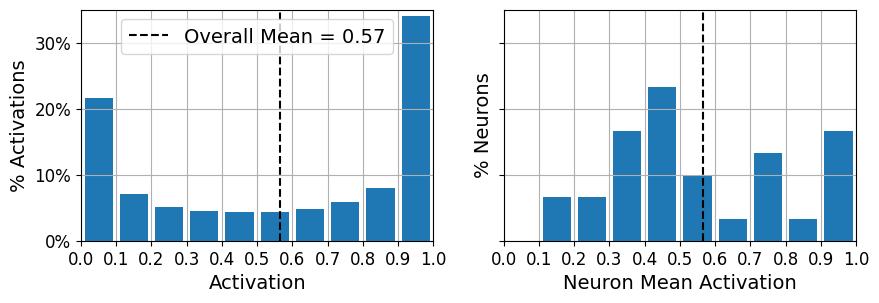

In [ ]:
plot_activations_histogram(simple_encoder, height=0.35)
plt.show()

Now let's add $\ell_1$ regularization to the coding layer:

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

sparse_l1_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid"),
    keras.layers.ActivityRegularization(l1=1e-3)  # Alternatively, you could add
                                                  # activity_regularizer=keras.regularizers.l1(1e-3)
                                                  # to the previous layer.
])
sparse_l1_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_l1_ae = keras.models.Sequential([sparse_l1_encoder, sparse_l1_decoder])
sparse_l1_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                     metrics=[rounded_accuracy])
history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.6179 - rounded_accuracy: 0.7117 - val_loss: 0.4934 - val_rounded_accuracy: 0.7289
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.4902 - rounded_accuracy: 0.7317 - val_loss: 0.4929 - val_rounded_accuracy: 0.7289
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.4899 - rounded_accuracy: 0.7317 - val_loss: 0.4928 - val_rounded_accuracy: 0.7289
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.4898 - rounded_accuracy: 0.7317 - val_loss: 0.4927 - val_rounded_accuracy: 0.7289
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.4898 - rounded_accuracy: 0.7317 - val_loss: 0.4927 - val_rounded_accuracy: 0.7289
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.4897 - rounded_accuracy: 0.7317 - val_loss: 0.4927 - val_rounded_accuracy: 0.7289
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.4897 - rounded_accuracy: 0.7317 - val_loss: 0.4927 - val_rou

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


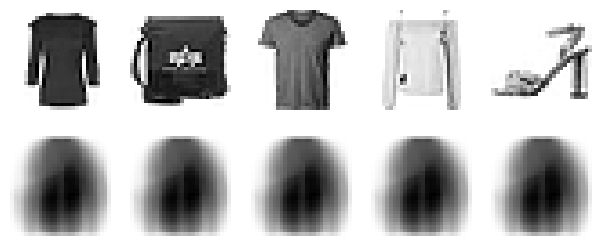

In [ ]:
show_reconstructions(sparse_l1_ae)

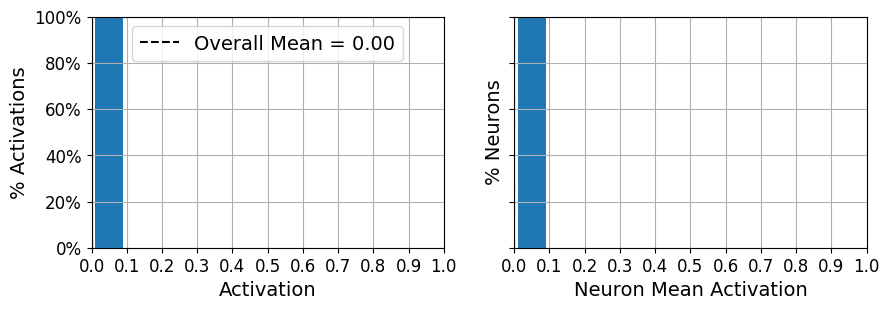

In [ ]:
plot_activations_histogram(sparse_l1_encoder, height=1.)
plt.show()

Let's use the KL Divergence loss instead to ensure sparsity, and target 10% sparsity rather than 0%:

Saving figure sparsity_loss_plot


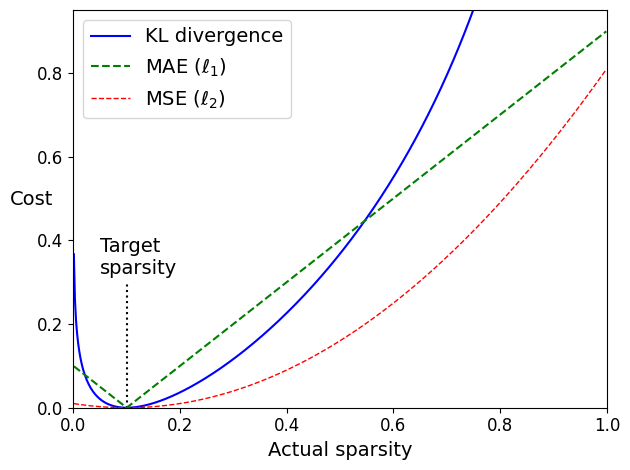

In [ ]:
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q)**2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])
save_fig("sparsity_loss_plot")

In [ ]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target
    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

kld_reg = KLDivergenceRegularizer(weight=0.05, target=0.1)
sparse_kl_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid", activity_regularizer=kld_reg)
])
sparse_kl_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_kl_ae = keras.models.Sequential([sparse_kl_encoder, sparse_kl_decoder])
sparse_kl_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
              metrics=[rounded_accuracy])
history = sparse_kl_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.8528 - rounded_accuracy: 0.7376 - val_loss: 0.4885 - val_rounded_accuracy: 0.7973
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.4160 - rounded_accuracy: 0.8342 - val_loss: 0.4473 - val_rounded_accuracy: 0.8124
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.3953 - rounded_accuracy: 0.8531 - val_loss: 0.4277 - val_rounded_accuracy: 0.8222
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3773 - rounded_accuracy: 0.8721 - val_loss: 0.4176 - val_rounded_accuracy: 0.8225
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.3649 - rounded_accuracy: 0.8809 - val_loss: 0.4092 - val_rounded_accuracy: 0.8272
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3564 - rounded_accuracy: 0.8870 - val_loss: 0.3991 - val_rounded_accuracy: 0.8364
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3488 - rounded_accuracy: 0.8933 - val_loss: 0.3927 - val_ro

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


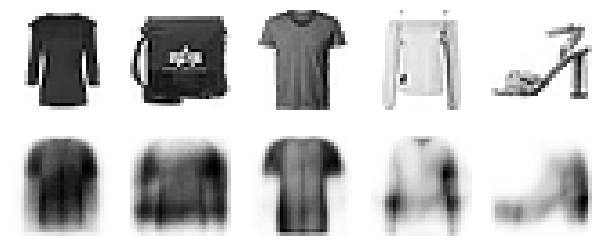

In [ ]:
show_reconstructions(sparse_kl_ae)

Saving figure sparse_autoencoder_plot


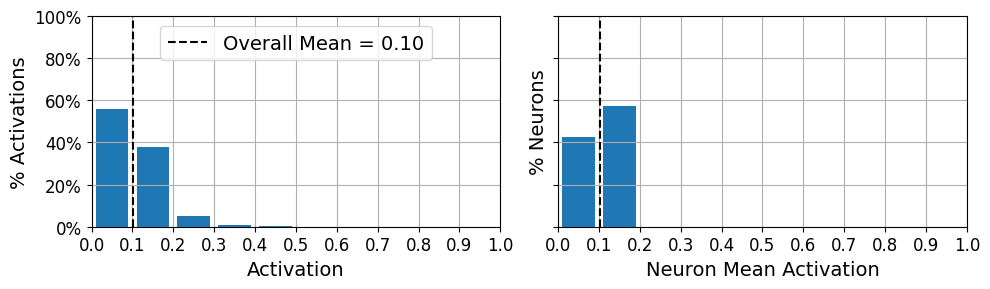

In [ ]:
plot_activations_histogram(sparse_kl_encoder)
save_fig("sparse_autoencoder_plot")
plt.show()

# Variational Autoencoder

## PDF mapping: Variational Autoencoder (VAE)

**PDF section:** *Variational Autoencoders* (PDF pp. 20–25).  
**Key idea from the PDF:** instead of mapping an input to a single deterministic coding, a VAE’s encoder outputs parameters of a distribution:
- a mean vector **μ** and a log-variance vector **γ = log(σ²)**,
then samples a latent vector **z** from that Gaussian.  
Training minimizes:
1) **reconstruction loss** (make outputs match inputs), plus  
2) **latent loss** (KL divergence that encourages z to follow a standard normal distribution).  
This structure makes VAEs **generative**: after training, you can sample z ~ N(0, I) and decode it to create new images.

### How the code implements it
- Uses the Functional API to create two encoder heads: `codings_mean` and `codings_log_var`.
- Implements the **reparameterization trick** with a custom `Sampling` layer:
  `z = ε * exp(γ/2) + μ`, where ε ~ N(0, I).
- Adds the latent KL term via `model.add_loss(...)`, then compiles with binary cross-entropy for reconstruction.


In [ ]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        # Use tf.random.normal instead of K.random_normal
        # Use tf.math.exp instead of K.exp
        return tf.random.normal(tf.shape(log_var)) * tf.math.exp(log_var / 2) + mean


In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 10

# Define a custom layer to handle the VAE latent loss
class VAELatentLoss(keras.layers.Layer):
    def call(self, inputs):
        codings_mean, codings_log_var = inputs
        latent_loss = -0.5 * tf.reduce_sum(
            1 + codings_log_var - tf.math.exp(codings_log_var) - tf.math.square(codings_mean),
            axis=-1)
        self.add_loss(tf.reduce_mean(latent_loss) / 784.)
        return inputs # This layer doesn't transform inputs, just adds a loss

inputs = keras.layers.Input(shape=[28, 28])
z = keras.layers.Flatten()(inputs)
z = keras.layers.Dense(150, activation="selu")(z)
z = keras.layers.Dense(100, activation="selu")(z)
codings_mean = keras.layers.Dense(codings_size)(z)
codings_log_var = keras.layers.Dense(codings_size)(z)
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = keras.models.Model(
    inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

decoder_inputs = keras.layers.Input(shape=[codings_size])
x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
x = keras.layers.Dense(150, activation="selu")(x)
x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
outputs = keras.layers.Reshape([28, 28])(x)
variational_decoder = keras.models.Model(inputs=[decoder_inputs], outputs=[outputs])

_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)

variational_ae = keras.models.Model(inputs=[inputs], outputs=[reconstructions])

# Add the custom latent loss layer to the model
VAELatentLoss()([codings_mean, codings_log_var])

variational_ae.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=[rounded_accuracy])
history = variational_ae.fit(X_train, X_train, epochs=25, batch_size=128,
                             validation_data=(X_valid, X_valid))

Epoch 1/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 0.4315 - rounded_accuracy: 0.8013 - val_loss: 0.3296 - val_rounded_accuracy: 0.8950
Epoch 2/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.3241 - rounded_accuracy: 0.8975 - val_loss: 0.3181 - val_rounded_accuracy: 0.9013
Epoch 3/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.3140 - rounded_accuracy: 0.9062 - val_loss: 0.3164 - val_rounded_accuracy: 0.9095
Epoch 4/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.3085 - rounded_accuracy: 0.9109 - val_loss: 0.3123 - val_rounded_accuracy: 0.9132
Epoch 5/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 0.3045 - rounded_accuracy: 0.9144 - val_loss: 0.3071 - val_rounded_accuracy: 0.9178
Epoch 6/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.3016 - rounded_accuracy: 0.9170 - val_loss: 0.3021 - val_rounded_accuracy: 0.9190
Epoch 7/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 0.2994 - rounded_accuracy: 0.9191 - val_loss: 0.3012 - val_rounded_accuracy:

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


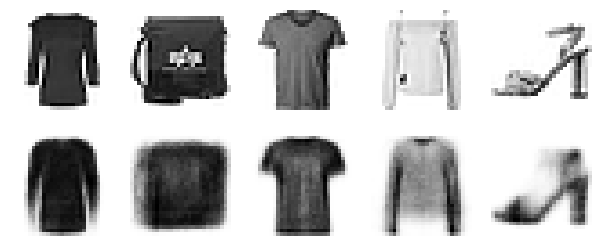

In [ ]:
show_reconstructions(variational_ae)
plt.show()

## Generate Fashion Images

### PDF mapping: Sampling and semantic interpolation in latent space

**PDF section:** *Generating Fashion MNIST Images* + *Semantic interpolation* (PDF pp. 24–25).  
**Key idea from the PDF:** once a VAE is trained, you can:
- **generate** new images by sampling random z from a Gaussian and decoding, and
- **interpolate semantically** by interpolating in latent space (z-space) rather than mixing pixels.

### How the code implements it
- Samples random latent vectors with `tf.random.normal(...)` and decodes them.
- Builds a grid of latent vectors and uses resizing/interpolation to create smooth transitions between nearby latent points, then decodes the interpolated vectors.


In [ ]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Let's generate a few random codings, decode them and plot the resulting images:

Saving figure vae_generated_images_plot


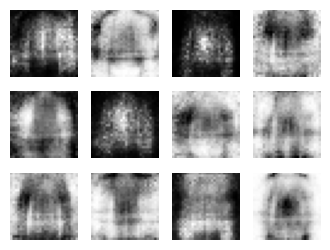

In [ ]:
tf.random.set_seed(42)

codings_size = 10 # Explicitly set codings_size back to 10 for VAE
codings = tf.random.normal(shape=[12, codings_size])
images = variational_decoder(codings).numpy()
plot_multiple_images(images, 4)
save_fig("vae_generated_images_plot", tight_layout=False)

Now let's perform semantic interpolation between these images:

Saving figure semantic_interpolation_plot


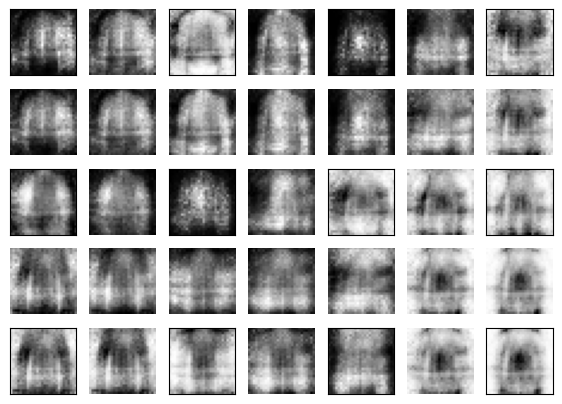

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 10 # Explicitly set codings_size back to 10 for VAE
codings_grid = tf.reshape(codings, [1, 3, 4, codings_size])
larger_grid = tf.image.resize(codings_grid, size=[5, 7])
interpolated_codings = tf.reshape(larger_grid, [-1, codings_size])
images = variational_decoder(interpolated_codings).numpy()

plt.figure(figsize=(7, 5))
for index, image in enumerate(images):
    plt.subplot(5, 7, index + 1)
    if index%7%2==0 and index//7%2==0:
        plt.gca().get_xaxis().set_visible(False)
        plt.gca().get_yaxis().set_visible(False)
    else:
        plt.axis("off")
    plt.imshow(image, cmap="binary")
save_fig("semantic_interpolation_plot", tight_layout=False)

# Generative Adversarial Networks

## PDF mapping: Generative Adversarial Networks (GANs)

**PDF section:** *Generative Adversarial Networks* (PDF pp. 26–29).  
**Key idea from the PDF:** a GAN has two networks trained in opposition:
- **Generator (G):** takes random noise (latent code) and produces fake images.
- **Discriminator (D):** classifies images as real (from dataset) or fake (from G).

Training alternates two phases per iteration:
1) Train **D** on a mixed batch of real + fake images (labels: fake=0, real=1).  
2) Train **G** via the combined model **G→D**, freezing D, and using labels “real” (1) so G learns to fool D.

### How the code implements it
- Builds a generator similar to an autoencoder decoder (Dense → Reshape).
- Builds a discriminator as a binary classifier (Flatten → Dense → sigmoid).
- Creates `gan = Sequential([generator, discriminator])`.
- Uses a custom training loop (`train_on_batch`) to implement the two-phase training described in the PDF.


In [ ]:
np.random.seed(42)
tf.random.set_seed(42)

codings_size = 30

generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [ ]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))              # not shown in the book
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)                     # not shown
        plt.show()                                                    # not shown

Epoch 1/1


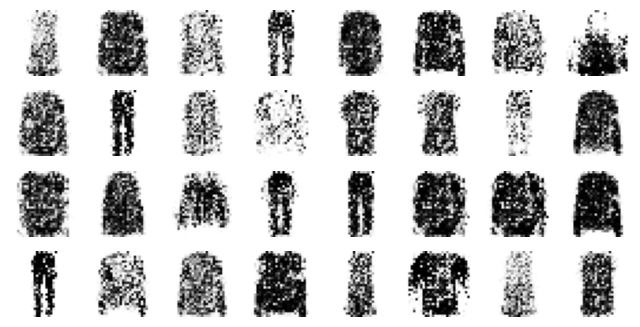

In [ ]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

Saving figure gan_generated_images_plot


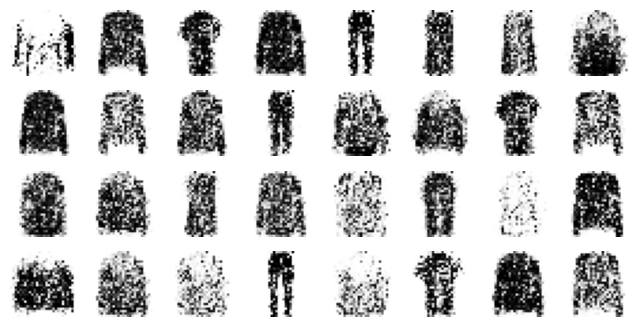

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
save_fig("gan_generated_images_plot", tight_layout=False)

Epoch 1/50


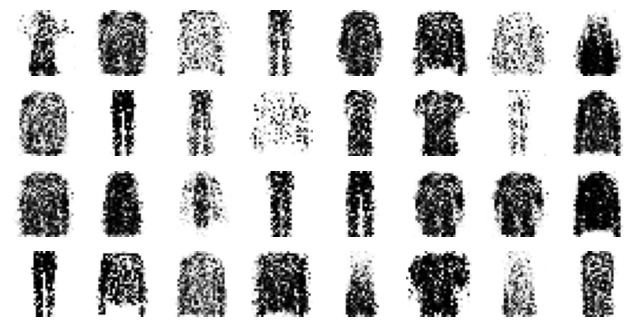

Epoch 2/50


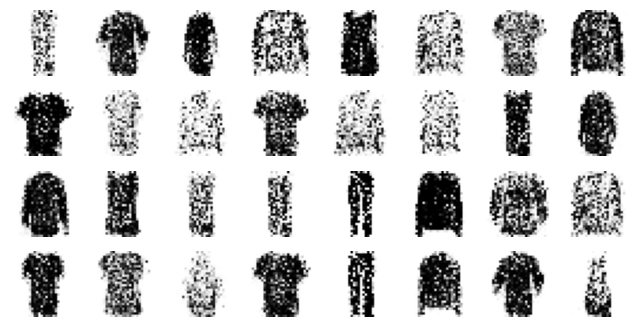

Epoch 3/50


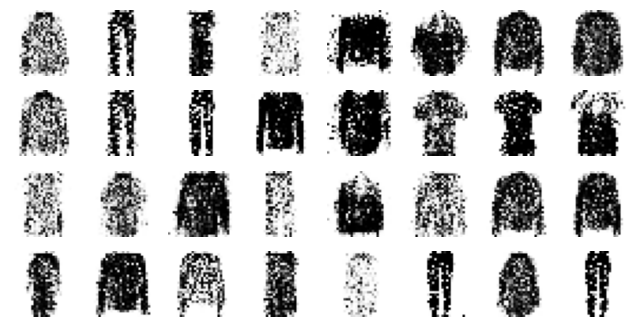

Epoch 4/50


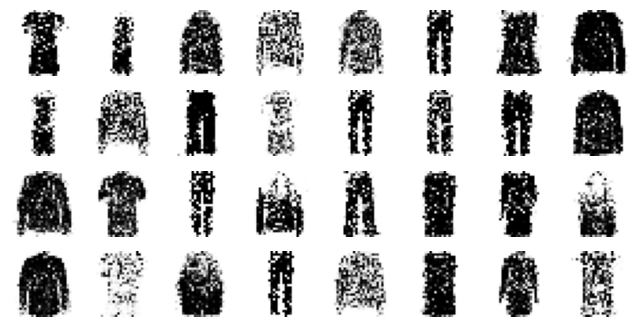

Epoch 5/50


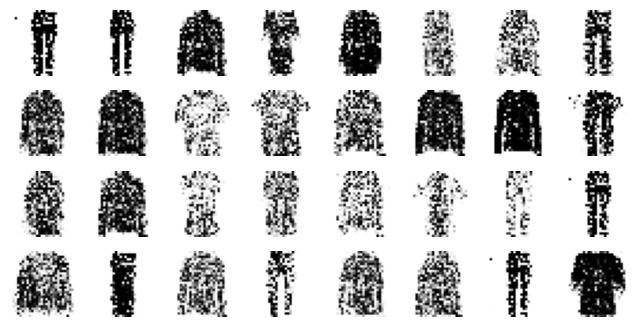

Epoch 6/50


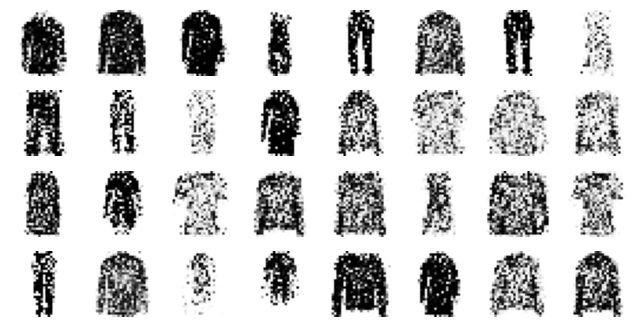

Epoch 7/50


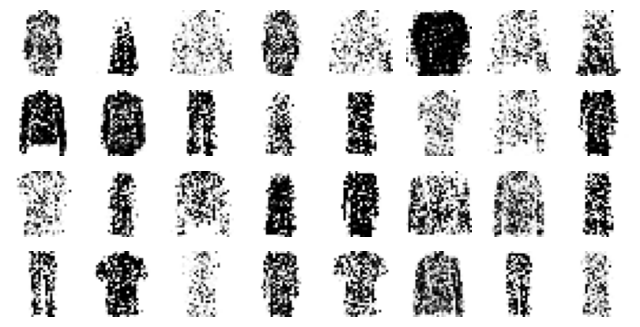

Epoch 8/50


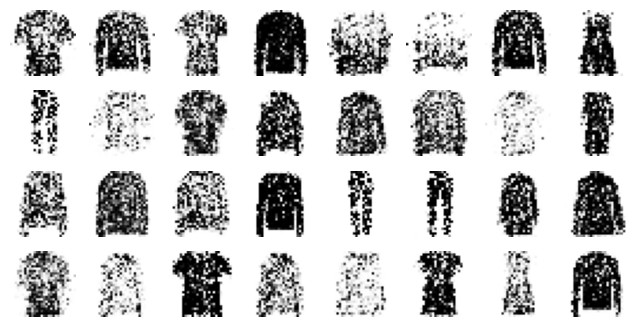

Epoch 9/50


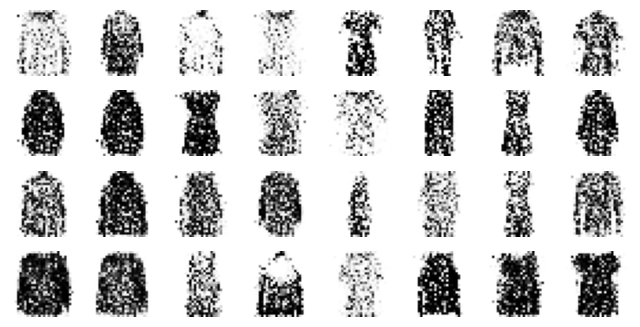

Epoch 10/50


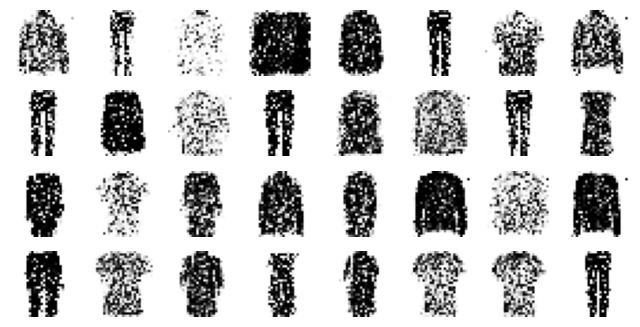

Epoch 11/50


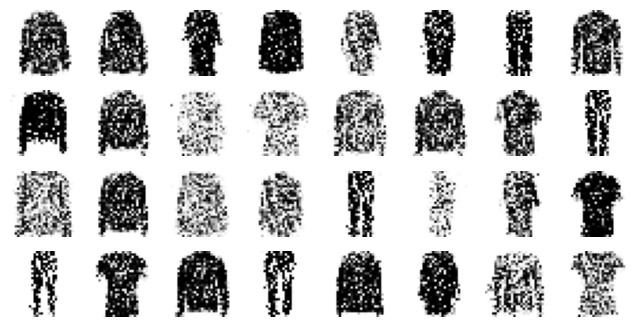

Epoch 12/50


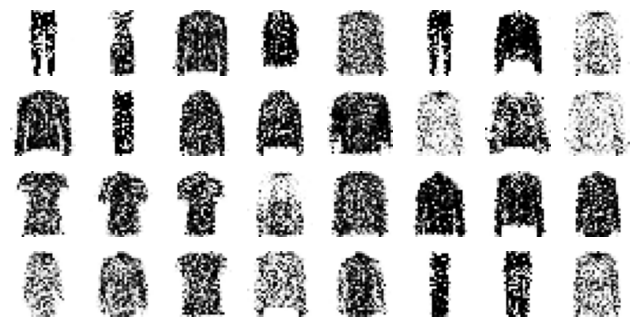

Epoch 13/50


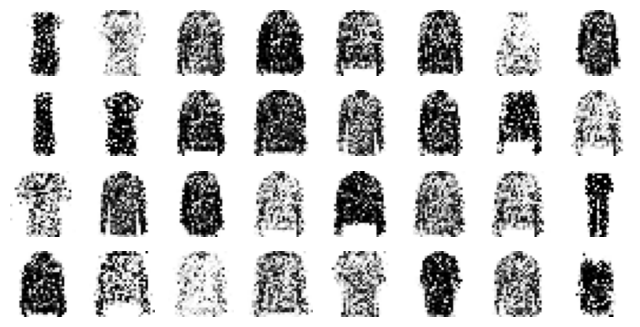

Epoch 14/50


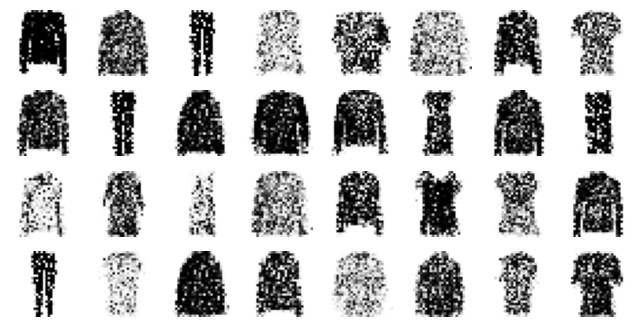

Epoch 15/50


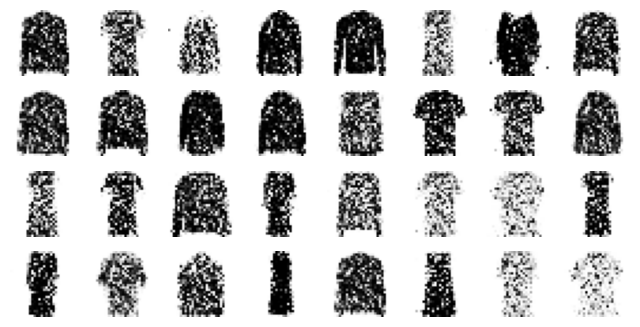

Epoch 16/50


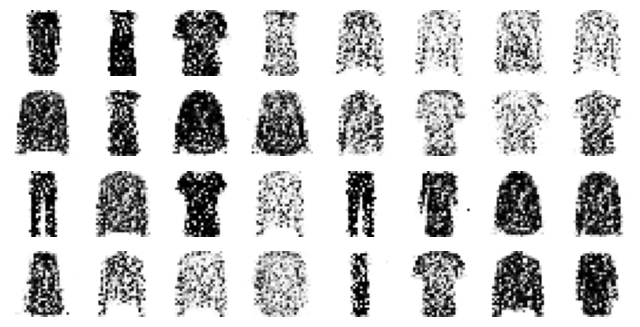

Epoch 17/50


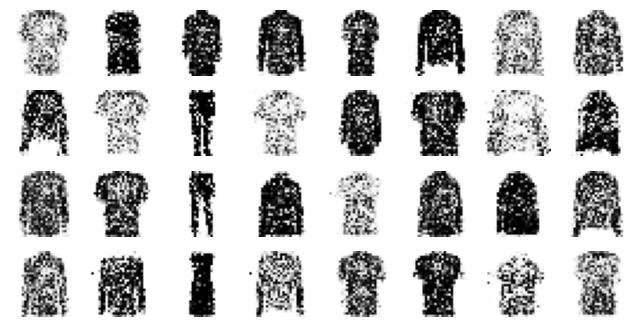

Epoch 18/50


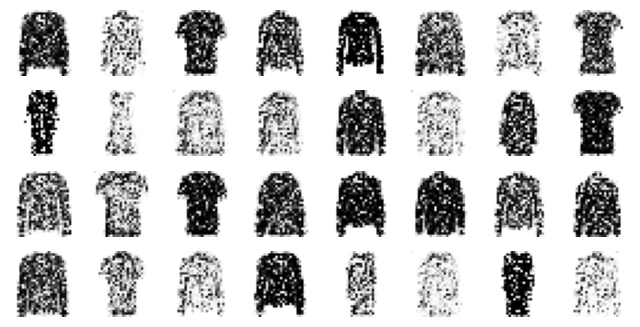

Epoch 19/50


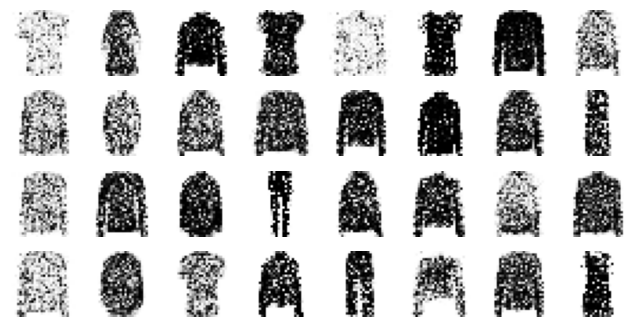

Epoch 20/50


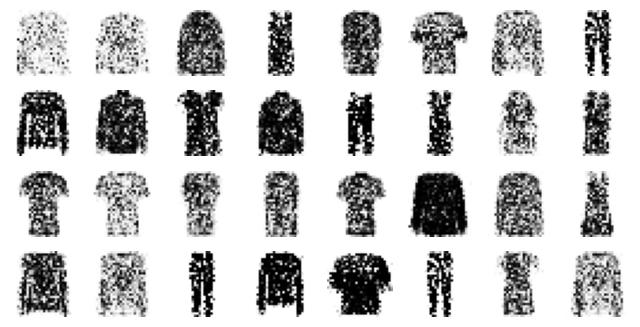

Epoch 21/50


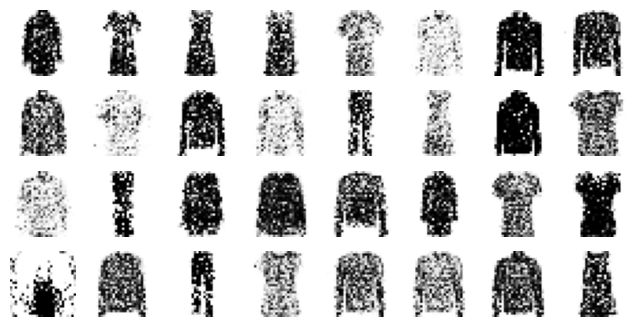

Epoch 22/50


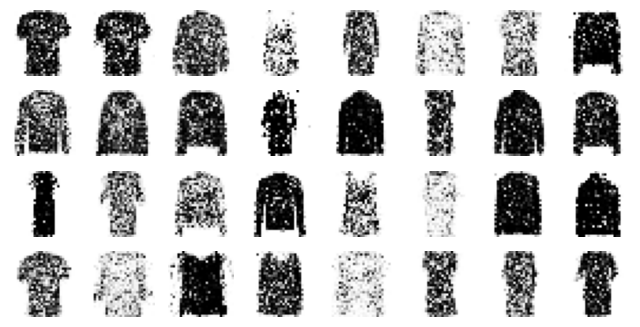

Epoch 23/50


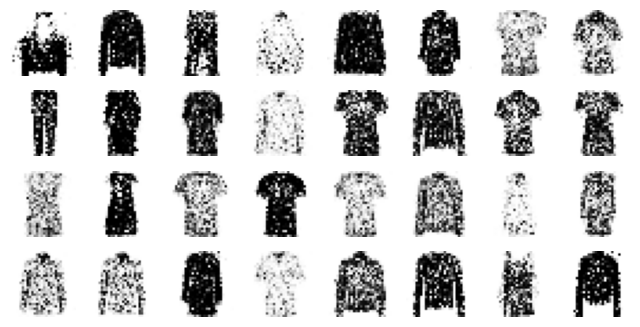

Epoch 24/50


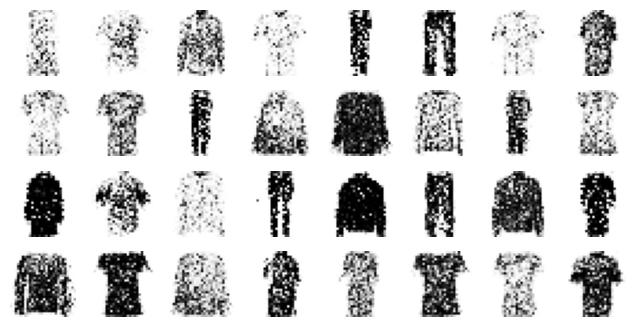

Epoch 25/50


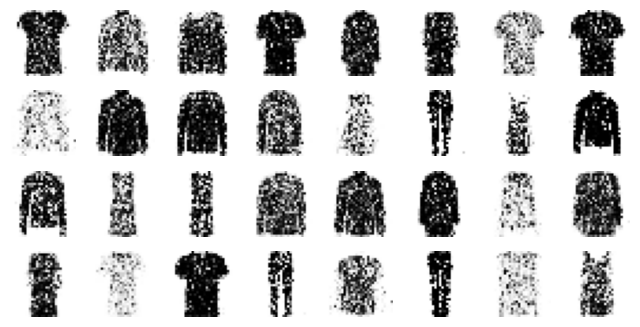

Epoch 26/50


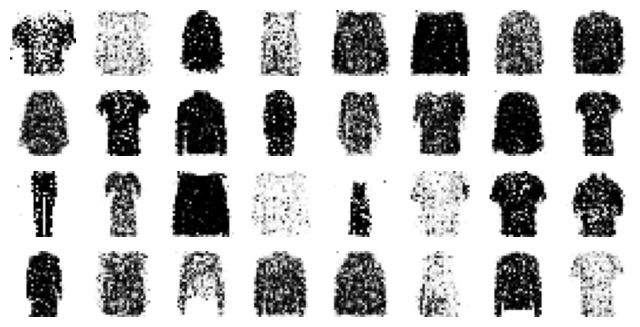

Epoch 27/50


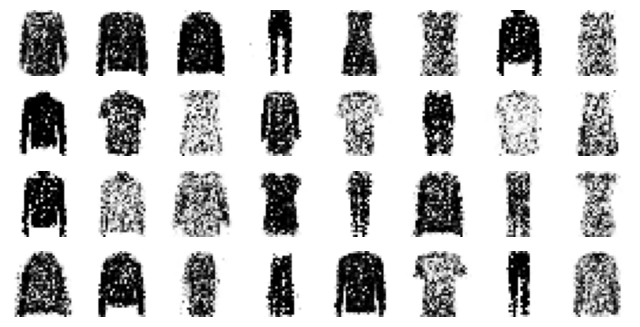

Epoch 28/50


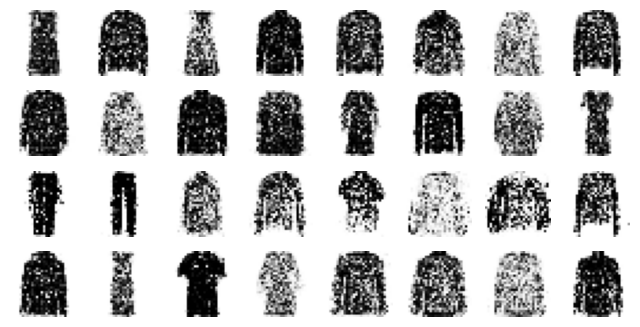

Epoch 29/50


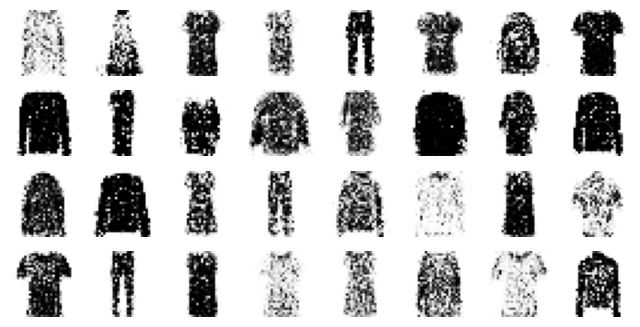

Epoch 30/50


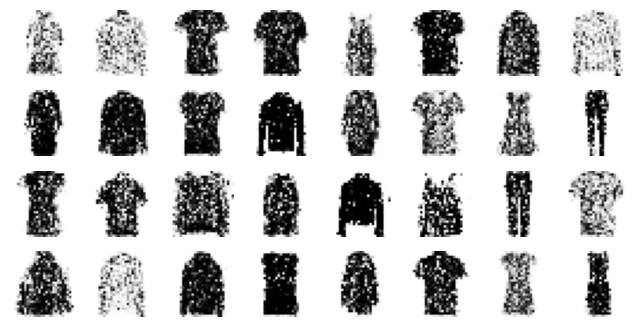

Epoch 31/50


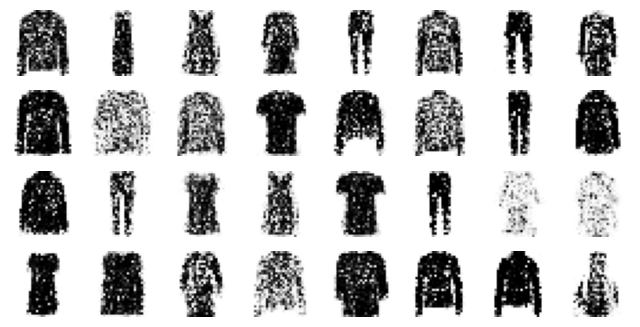

Epoch 32/50


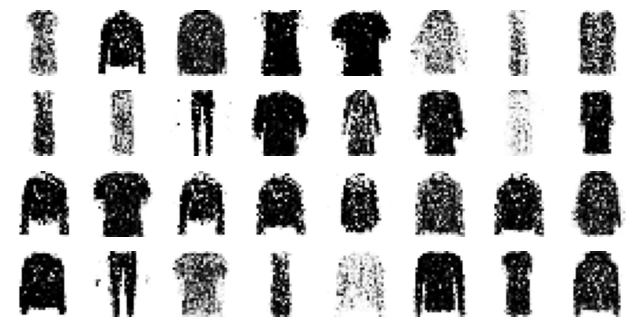

Epoch 33/50


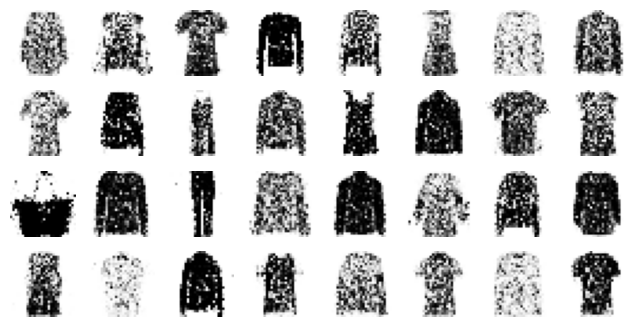

Epoch 34/50


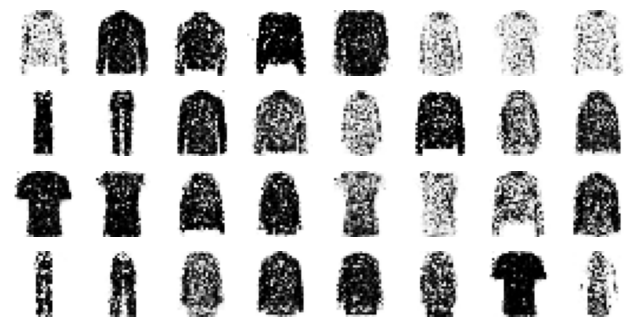

Epoch 35/50


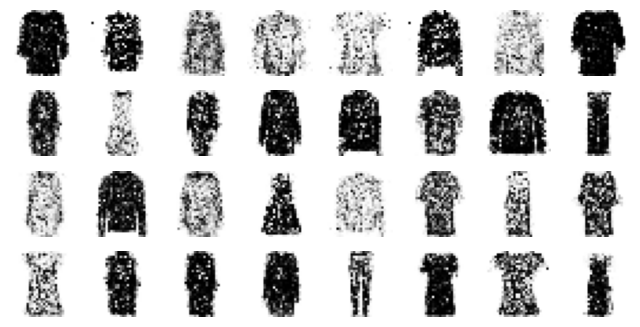

Epoch 36/50


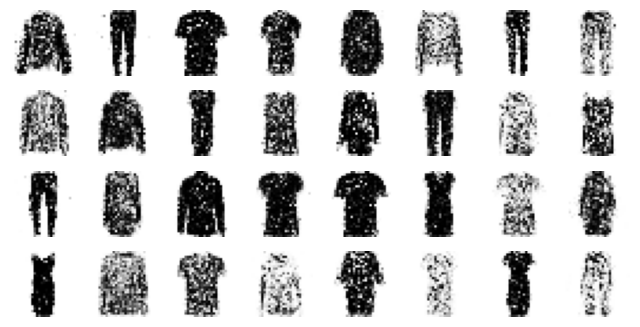

Epoch 37/50


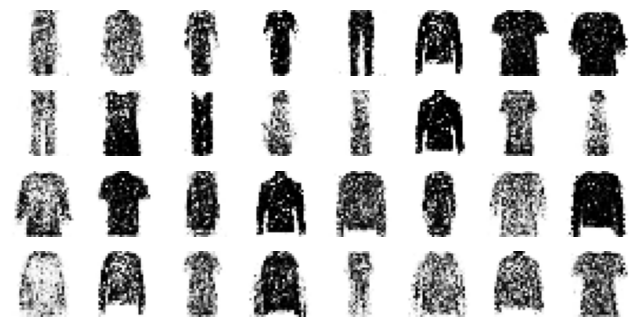

Epoch 38/50


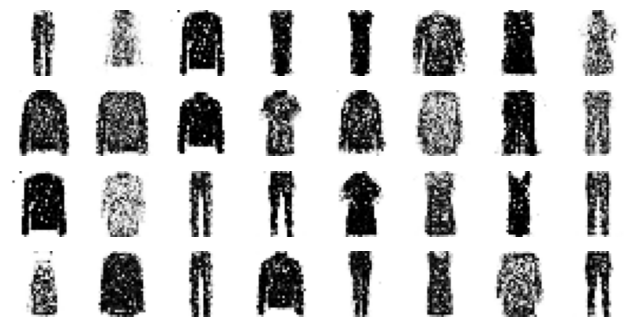

Epoch 39/50


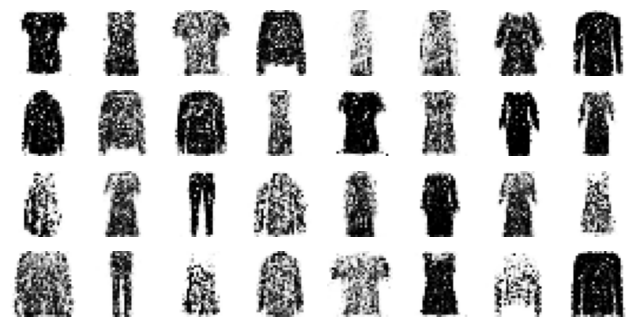

Epoch 40/50


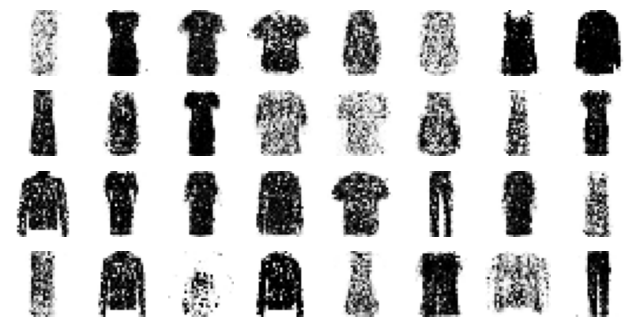

Epoch 41/50


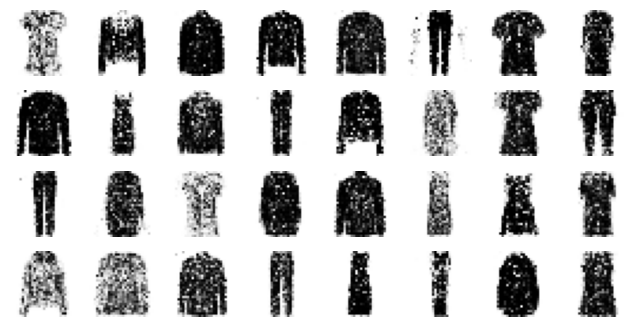

Epoch 42/50


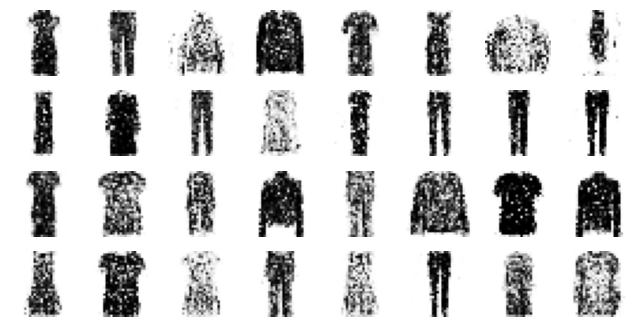

Epoch 43/50


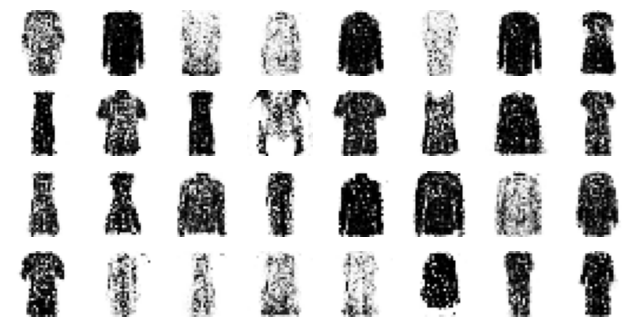

Epoch 44/50


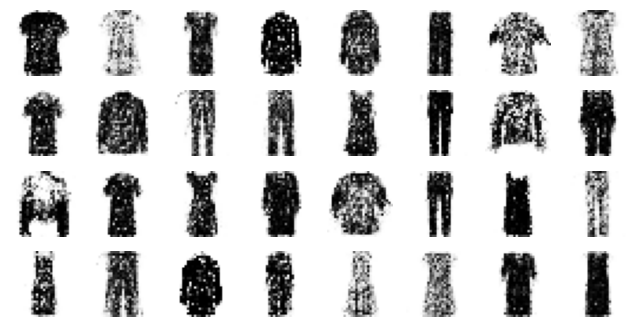

Epoch 45/50


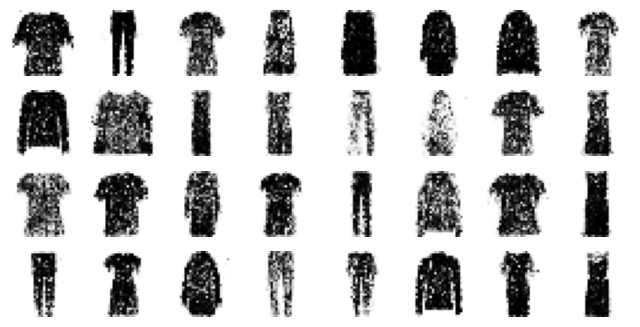

Epoch 46/50


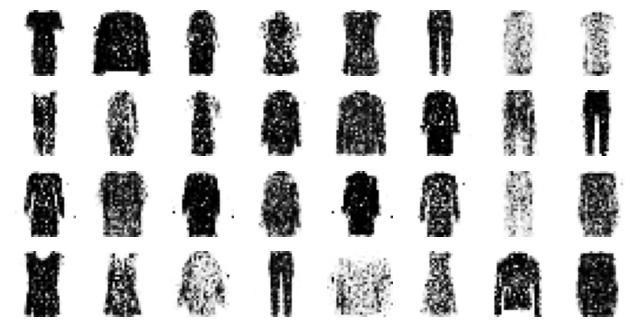

Epoch 47/50


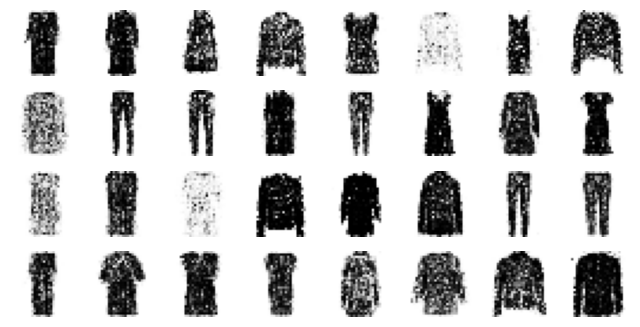

Epoch 48/50


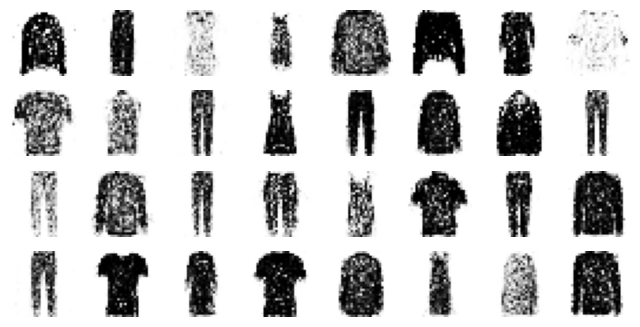

Epoch 49/50


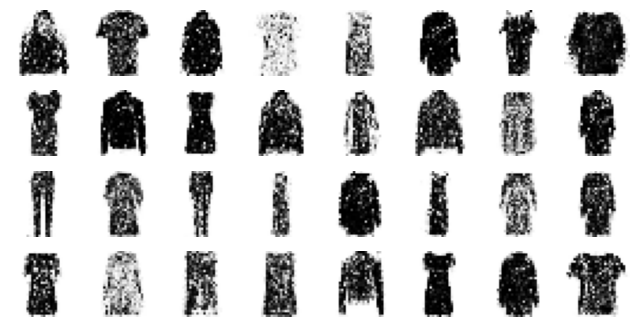

Epoch 50/50


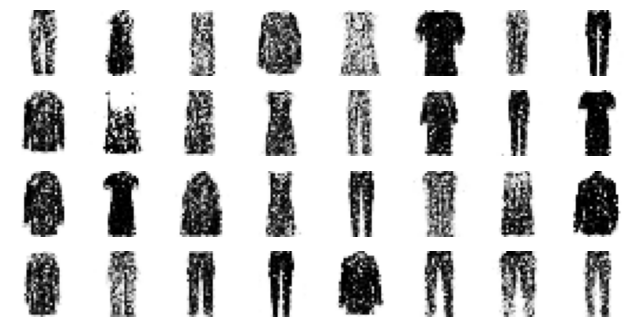

In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

# Deep Convolutional GAN

## PDF mapping: Deep Convolutional GAN (DCGAN)

**PDF section:** *Deep Convolutional GANs* (PDF pp. 32–34).  
**Key idea from the PDF:** DCGANs stabilize GAN training for images by using convolutional design guidelines (e.g., strided convolutions, transposed convolutions, careful normalization/activations).

### How the code implements it
- The generator:
  - projects noise into a small spatial tensor (e.g., 7×7×128),
  - upsamples using `Conv2DTranspose` layers to 28×28.
- The discriminator:
  - downsamples using strided `Conv2D`,
  - ends with a sigmoid output for real/fake probability.
- Because the generator output uses **tanh** (range −1…1), the training images are rescaled to the same range before training.


In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                 activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

In [ ]:
import tensorflow as tf
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/50


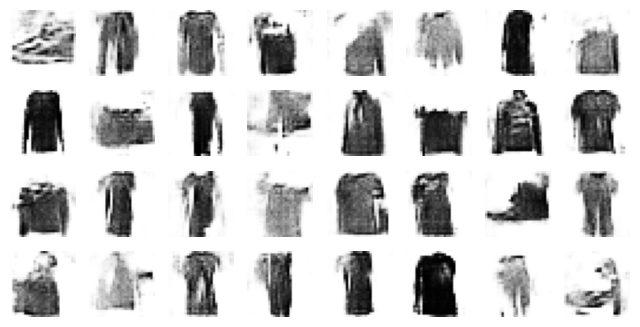

Epoch 2/50


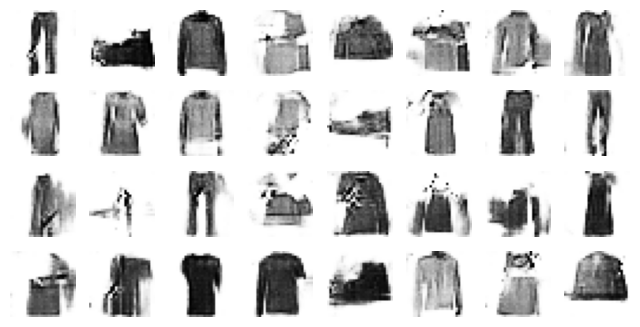

Epoch 3/50


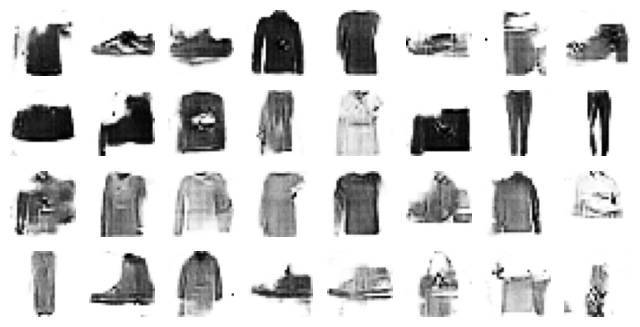

Epoch 4/50


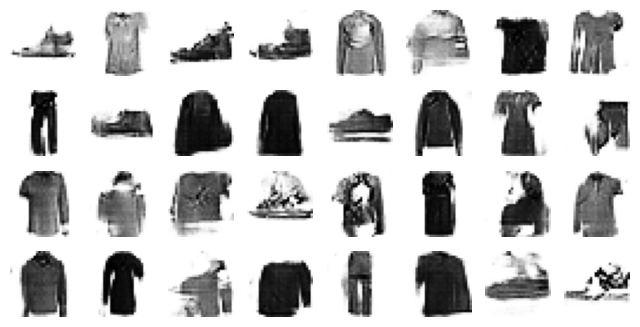

Epoch 5/50


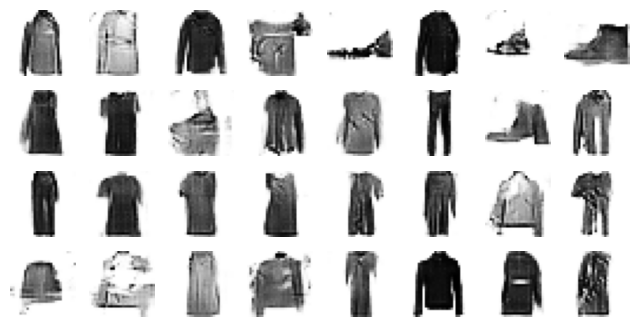

Epoch 6/50


In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
save_fig("dcgan_generated_images_plot", tight_layout=False)